In [ ]:
%load_ext autoreload
%autoreload 2

import matplotlib.pyplot as plt
import numpy as np
from IPython.display import display, clear_output
from functools import partial

import torch
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torch.utils.tensorboard import SummaryWriter

from src.config import Config
from src.episode import Episode
from src.episode_dataset import EpisodeDataset
from src.policy_factory import PolicyMode, PolicyFactory
from src.reward_model import RewardModel
from src.grpo_trainer import GRPOTrainer
from src.policy_model_utils import load_policy_model, save_policy_model, train_and_plot_policy, inference_and_plot_policy
from src.utils import get_color, normalize_min_max, to_device_collate, top_k_sampling
from src.episode_batch_repeat_sampler import EpisodeBatchRepeatSampler

# Setup
---

In [ ]:
config = Config()
reward_model = RewardModel(config=config)

# Datasets

train_dataset = EpisodeDataset(config=config, split="TRAIN")
print(f"train_dataset : {len(train_dataset)}")

test_dataset = EpisodeDataset(config=config, split="TEST")
print(f"test_dataset : {len(test_dataset)}")

eval_dataset = EpisodeDataset(config=config, split="EVAL")
print(f"eval_dataset : {len(eval_dataset)}")


# DataLoaders
def get_data_loader(
    dataset: EpisodeDataset, batch_size: int, group_size: int, repeats: int
):
    batch_repeat_sampler = EpisodeBatchRepeatSampler(
        dataset=dataset,
        batch_size=batch_size,
        group_size=group_size,
        repeats=repeats,
    )
    # print(
    #     f"batch_repeat_sampler: {len(batch_repeat_sampler)},  {list(batch_repeat_sampler)}"
    # )
    # print(
    #     f"batch ids: {[e.episode_id for e in dataset.get_episods(batch_episode_idices=list(batch_repeat_sampler))]}"
    # )

    to_device_collate_configurable = partial(to_device_collate, config.device)
    dataloader = DataLoader(
        train_dataset,
        batch_size=batch_size * group_size,
        sampler=batch_repeat_sampler,
        collate_fn=to_device_collate_configurable,
    )
    print(f"data loader: {dataset.split}, {len(dataloader)}")
    return dataloader


train_dataloader = get_data_loader(
    dataset=train_dataset,
    batch_size=config.train_batch_size,
    group_size=config.episode_group_size,
    repeats=config.episode_steps,
)
test_dataloader = get_data_loader(
    dataset=test_dataset,
    batch_size=config.test_batch_size,
    group_size=config.episode_group_size,
    repeats=config.episode_steps,
)

eval_dataloader = get_data_loader(
    dataset=eval_dataset,
    batch_size=config.eval_batch_size,
    group_size=config.episode_group_size,
    repeats=config.episode_steps,
)

train_dataset : 50000
test_dataset : 50000
eval_dataset : 50000
data loader: TRAIN, 400
data loader: TEST, 400
data loader: EVAL, 400


In [ ]:
# for idx, batch_data in enumerate(train_dataloader):
#     batch_episode_idices = batch_data.get("episode_idx")
#     print(
#         f"idx: {idx}, batch_items: {len(batch_episode_idices)}, batch ids: {[e.episode_id for e in train_dataset.get_episods(batch_episode_idices=batch_episode_idices)]}"
#     )

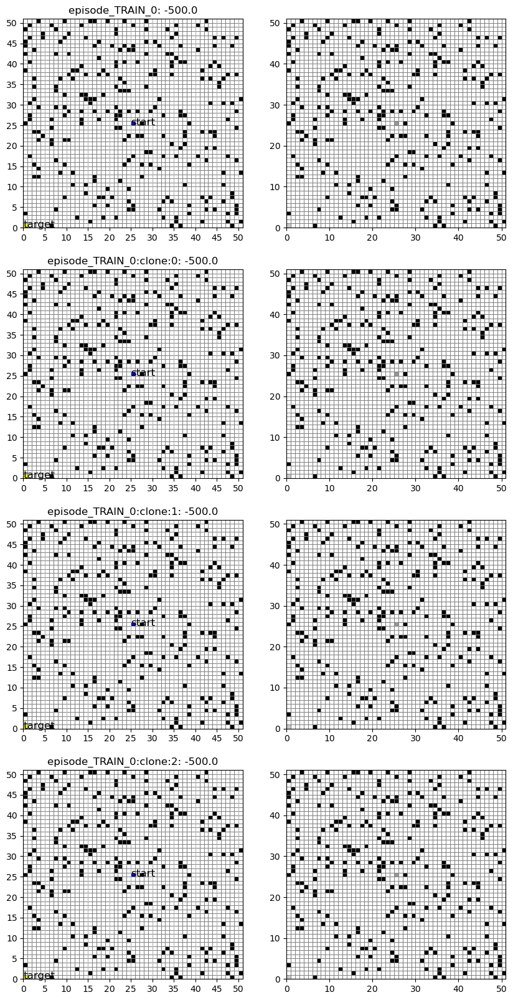

In [4]:
episode_samples = 4
fig, axes = plt.subplots(nrows=episode_samples, ncols=2, figsize=(10, 20))

for eidx in range(episode_samples):
    es = train_dataset.get_episode(eidx)

    es.viz(ax=axes[eidx][0], reward_model=reward_model)

    # Viz fov
    fov = es.fov(center_pos=es.agent.start_state.position())
    # print(f"fov: {fov.size()}, {fov}")
    # print(f"fov: {fov}")
    es.viz_fov(ax=axes[eidx][1])
plt.show()

step: 0, logits: tensor([[ 4.8784e+02,  2.1974e+02,  5.6606e+00,  5.5180e+01,  1.6121e+02,
         -7.1630e-02,  5.5809e+01,  1.7846e+02,  5.0652e+02]]), logit_prob: tensor([[0.1953]]), top_k_prob: tensor([[1.]]), action_idx: tensor([[8]]), state: tensor([26, 26]), action_history: [tensor(8)]
step: 1, logits: tensor([[ 244.6489,   26.6572,  149.9477,  197.0632,  -63.9594, -119.0799,
          210.1729,  333.3504,  511.3521]]), logit_prob: tensor([[0.1841]]), top_k_prob: tensor([[1.]]), action_idx: tensor([[8]]), state: tensor([27, 27]), action_history: [tensor(8), tensor(8)]
step: 2, logits: tensor([[173.3590, 141.7984, -88.8875, 135.0317, 186.2970,  78.7579, 310.5731,
         269.3698, 599.2496]]), logit_prob: tensor([[0.1914]]), top_k_prob: tensor([[1.]]), action_idx: tensor([[8]]), state: tensor([28, 28]), action_history: [tensor(8), tensor(8), tensor(8)]
step: 3, logits: tensor([[ 630.2451,   91.7860,   29.5444,  285.7178,  292.2636, -172.5724,
            6.3381,  135.7274,  634

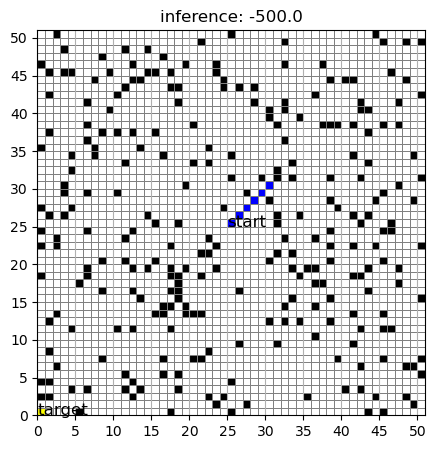

In [ ]:
test_policy = PolicyFactory.create(policy_mode=PolicyMode.LINEAR_MODEL, config=config)
episode = inference_and_plot_policy(
    policy=test_policy, config=config, reward_model=reward_model, steps=5, debug=True
)
# episode.agent.action_history

In [6]:
# np.linalg.norm([8, 6], ord=1)
episode.reward(reward_model=reward_model)

tensor(-500.)

# Training Loop
---

In [ ]:
policy = PolicyFactory.create(policy_mode=PolicyMode.LINEAR_MODEL, config=config)
reward_model = RewardModel(config=config)
trainer = GRPOTrainer(config=config, policy=policy, reward_model=reward_model)

step: 0, logits: tensor([[-552.7354,   19.8142,  -34.1169,  114.5854,  717.9290,   49.4108,
         -136.1142,   15.3811, -219.6385]]), logit_prob: tensor([[0.1896]]), top_k_prob: tensor([[1.]]), action_idx: tensor([[4]]), state: tensor([25, 25]), action_history: [tensor(4)]
step: 1, logits: tensor([[-552.7354,   19.8142,  -34.1169,  114.5854,  717.9290,   49.4108,
         -136.1142,   15.3811, -219.6385]]), logit_prob: tensor([[0.1896]]), top_k_prob: tensor([[1.]]), action_idx: tensor([[4]]), state: tensor([25, 25]), action_history: [tensor(4), tensor(4)]
step: 2, logits: tensor([[-552.7354,   19.8142,  -34.1169,  114.5854,  717.9290,   49.4108,
         -136.1142,   15.3811, -219.6385]]), logit_prob: tensor([[0.1896]]), top_k_prob: tensor([[1.]]), action_idx: tensor([[4]]), state: tensor([25, 25]), action_history: [tensor(4), tensor(4), tensor(4)]
step: 3, logits: tensor([[-552.7354,   19.8142,  -34.1169,  114.5854,  717.9290,   49.4108,
         -136.1142,   15.3811, -219.6385]]),

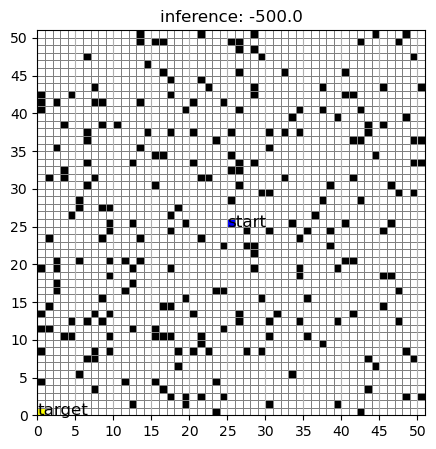

In [8]:
# Before tarin, policy behavior
episode = inference_and_plot_policy(
    policy=policy, config=config, reward_model=reward_model, steps=5, debug=True
)

In [9]:
# plt.ioff()
trainer.run(train_dataset=train_dataset, eval_dataset=eval_dataset, debug=False)
save_policy_model(policy=policy)

# plt.ion()

batch_repeat_sampler: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 21

Epoch 1:   0%|          | 0/400 [00:00<?, ?it/s]/opt/anaconda3/envs/torch/lib/python3.11/site-packages/torch/utils/data/dataloader.py:683: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)
Epoch 1: 100%|██████████| 400/400 [13:57<00:00,  2.09s/it, split=TRAIN, should_run_optimization=1, current_batch_episode_idx=[2375000, 2375001, 2375002, 2375003, 2375004, 2375005, 2375006, 2375007, 2375008, 2375009, 2375010, 2375011, 2375012, 2375013, 2375014, 2375015, 2375016, 2375017, 2375018, 2375019, 2375020, 2375021, 2375022, 2375023, 2375024, 2375025, 2375026, 2375027, 2375028, 2375029, 2375030, 2375031, 2375032, 2375033, 2375034, 2375035, 2375036, 2375037, 2375038, 2375039, 2375040, 2375041, 2375042, 2375043, 2375044, 2375045, 2375046, 2375047, 2375048, 2375049, 2375050, 2375051, 2375052, 2375053, 2375054, 2375055, 2375056, 2375057, 2375058, 2375059, 2375060, 2375061, 2375062, 2375063, 2375064, 237

model_path: rf_model_policy_20250512012509.pt
Save policy model to: rf_model_policy_20250512012509.pt


step: 0, logits: tensor([[ 2.9930e+11,  2.3675e+11,  2.6590e+11,  2.4356e+11,  1.4864e+12,
          2.9551e+11,  2.7820e+11, -2.8618e+12,  2.8212e+11]]), logit_prob: tensor([[0.1501]]), top_k_prob: tensor([[1.]]), action_idx: tensor([[4]]), state: tensor([25, 25]), action_history: [tensor(4)]
step: 1, logits: tensor([[ 2.9930e+11,  2.3675e+11,  2.6590e+11,  2.4356e+11,  1.4864e+12,
          2.9551e+11,  2.7820e+11, -2.8618e+12,  2.8212e+11]]), logit_prob: tensor([[0.1501]]), top_k_prob: tensor([[1.]]), action_idx: tensor([[4]]), state: tensor([25, 25]), action_history: [tensor(4), tensor(4)]
step: 2, logits: tensor([[ 2.9930e+11,  2.3675e+11,  2.6590e+11,  2.4356e+11,  1.4864e+12,
          2.9551e+11,  2.7820e+11, -2.8618e+12,  2.8212e+11]]), logit_prob: tensor([[0.1501]]), top_k_prob: tensor([[1.]]), action_idx: tensor([[4]]), state: tensor([25, 25]), action_history: [tensor(4), tensor(4), tensor(4)]
step: 3, logits: tensor([[ 2.9930e+11,  2.3675e+11,  2.6590e+11,  2.4356e+11,  1.4

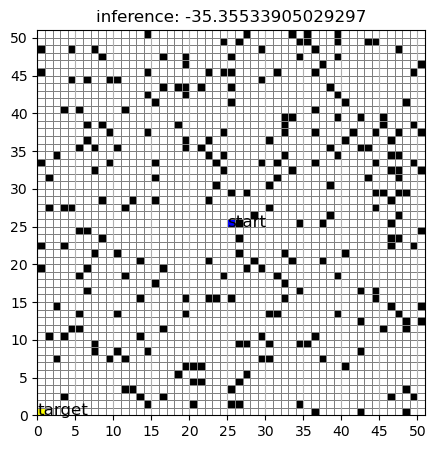

episode reward: -35.35533905029297


In [15]:
# post model training
episode = inference_and_plot_policy(
    policy=policy,
    config=config,
    reward_model=reward_model,
    steps=config.episode_steps,
    debug=True,
)
print(f"episode reward: {episode.reward(reward_model=reward_model)}")

In [11]:
print(f"episode reward: {episode.reward(reward_model=reward_model)}")

episode reward: -500.0


# Evaluate the Model
----

In [12]:
# policy_model_path = (
#     "/Users/chengbai/ml/cheng_git/rf_agent/rf_model_policy_20250510230738_base.pt"
# )
# trained_policy = load_policy_model(config=config, policy_model_path=policy_model_path)
# assert trained_policy is not None

# episode = inference_and_plot_policy(
#     policy=trained_policy, config=config, reward_model=reward_model, steps=5, debug=True
# )